# Superresolution of Proba-V Satellite Imagery
## Casey Primel
## Final Project for CS-GY 6433 Computer Vision w/Prof. Gerig (Spring 2022)


**Instructions**

Whether training or evaluating, run all import code cells at beginning of notebook.

- To run training, uncomment code in section "Setup/Training?" and comment out code in "Setup/Skipping to evaluation?". 
- To run evaluation with a pre-trained model, vice-versa.

For training, continue to execute all cells... one training session takes a long coffee break. **IMPORTANT:** Training requires a GPU instance with >= 32GB main memory.

For evaluation, continue to:
- Download, load and preprocess data (need evaluation data!).
- Run cells in "WDSR-3D Network" (can skip "Loss functions").
- Skip to "Evaluation"


## Section 0: Setup

In [ ]:
from typing import List, Tuple, Dict, Any
import os
import gc
import pickle
from glob import glob
from tqdm import tqdm
import logging

import math
import numpy as np
import matplotlib.pyplot as plt

from skimage import io
from skimage.registration import phase_cross_correlation
from scipy import ndimage
from skimage.color import gray2rgb
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from keras import applications, datasets, layers, losses, metrics, models, regularizers, optimizers, Input, Model
from tensorflow.keras.optimizers import schedules, Adam
from keras.applications import vgg19


In [ ]:
!pip install tensorflow-addons

     |████████████████████████████████| 1.1 MB 4.3 MB/s 


In [ ]:
import tensorflow_addons.layers as tfa

In [ ]:
logging.basicConfig(format='%(asctime)s - %(message)s', level=logging.INFO)
logger = logging.getLogger('__name__')

### Training?

If training, uncomment the following cells.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
proj_root = '/content/drive/MyDrive/cs6344_superresolution'
model_dir = os.path.join(proj_root, 'models')
log_dir = os.path.join(proj_root, 'logs')

### Skipping to evaluation?

If skipping training, make sure these cells are uncommented and comment out the previous two code cells.

In [ ]:
# Uncomment and run cell to download trained model
!gdown --fuzzy https://drive.google.com/file/d/1PKrjyuj3bvR6a5qTJF_YH9A1uJ24Hc3Z/view?usp=sharing && unzip /content/models-20220513T015629Z-001.zip

Downloading...
From: https://drive.google.com/uc?id=1PKrjyuj3bvR6a5qTJF_YH9A1uJ24Hc3Z
To: /content/models-20220513T015629Z-001.zip
100% 18.2M/18.2M [00:00<00:00, 191MB/s]
Archive:  /content/models-20220513T015629Z-001.zip
replace models/checkpoint? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: models/checkpoint       
replace models/ckpt-224.index? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: models/ckpt-224.index   
  inflating: models/ckpt-223.index   
  inflating: models/ckpt-223.data-00000-of-00001  
  inflating: models/ckpt-222.index   
  inflating: models/ckpt-220.index   
  inflating: models/ckpt-221.data-00000-of-00001  
  inflating: models/ckpt-220.data-00000-of-00001  
  inflating: models/ckpt-224.data-00000-of-00001  
  inflating: models/ckpt-221.index   
  inflating: models/ckpt-222.data-00000-of-00001  


In [ ]:
# Uncomment and run to set 
model_dir = '/content/models'

### Check available resources (skippable)

In [ ]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
!free -th

              total        used        free      shared  buff/cache   available
Mem:            51G        1.5G         47G        1.2M        2.3G         49G
Swap:            0B          0B          0B
Total:          51G        1.5G         47G


In [ ]:
!nvidia-smi

Fri May 13 01:37:37 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    24W / 300W |      2MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Section 1: Load and preprocess data

In [ ]:
!rm -rf raw_data && mkdir raw_data && rm -rf pickled && mkdir pickled && rm -rf processed && mkdir processed 

In [ ]:
!cd raw_data && gdown --fuzzy https://drive.google.com/uc?id=1-5w84FBVVjGGwhmeUnkr3OJWBoZJ2RY2

Downloading...
From: https://drive.google.com/uc?id=1-5w84FBVVjGGwhmeUnkr3OJWBoZJ2RY2
To: /content/raw_data/probav_data.zip.zip?download=1
100% 708M/708M [00:06<00:00, 115MB/s]


In [ ]:
!cd raw_data && unzip probav_data.zip.zip?download=1

Streaming output truncated to the last 5000 lines.
  inflating: train/RED/imgset0470/QM008.png  
  inflating: train/RED/imgset0470/QM009.png  
  inflating: train/RED/imgset0470/QM010.png  
  inflating: train/RED/imgset0470/QM011.png  
  inflating: train/RED/imgset0470/QM012.png  
  inflating: train/RED/imgset0470/SM.png  
   creating: train/RED/imgset0471/
  inflating: train/RED/imgset0471/HR.png  
  inflating: train/RED/imgset0471/LR000.png  
  inflating: train/RED/imgset0471/LR001.png  
  inflating: train/RED/imgset0471/LR002.png  
  inflating: train/RED/imgset0471/LR003.png  
  inflating: train/RED/imgset0471/LR004.png  
  inflating: train/RED/imgset0471/LR005.png  
  inflating: train/RED/imgset0471/LR006.png  
  inflating: train/RED/imgset0471/LR007.png  
  inflating: train/RED/imgset0471/LR008.png  
  inflating: train/RED/imgset0471/LR009.png  
  inflating: train/RED/imgset0471/LR010.png  
  inflating: train/RED/imgset0471/LR011.png  
  inflating: train/RED/imgset0471/LR012.png  


### 1.1: Pickling raw data

In [ ]:
"""
    Loads and pickles images from dataset. 
"""
def pickle_training_data(in_dir: str, out_dir: str, band: str, num_training_samples: int = -1) -> None:

    train_dir = os.path.join(in_dir, 'train/'+band)
    dir_list = glob(train_dir+'/imgset*')
    dir_list.sort()

    logging.info("Pickling lowres training images...")
    input_LR = np.array([[io.imread(fname) for fname in sorted(glob(dir_name+'/LR*.png'))]
                                for dir_name in dir_list],dtype=object)
    
    # Select number of training samples, default=ALL
    num_sets = input_LR.shape[0]
    if num_training_samples == -1 or num_training_samples > num_sets:
        num_training_samples = num_sets
    
    input_LR[:num_training_samples].dump(os.path.join(out_dir, f'LR_dataset_{band}.npy'))

    logging.info("Pickling highres training images...")
    input_HR = np.array(
        [io.imread(glob(dir_name+'/HR.png')[0]) for dir_name in dir_list],dtype=object)

    input_HR[:num_training_samples].dump(os.path.join(out_dir, f'HR_dataset_{band}.npy'))

    logging.info("Pickling highres training masks...")
    mask_HR = np.array([io.imread(glob(dir_name+'/SM.png')[0])
                        for dir_name in dir_list],dtype=object)

    mask_HR[:num_training_samples].dump(os.path.join(out_dir, f'HR_mask_{band}.npy'))

    logging.info("Pickling lowres training masks...")
    mask_LR = np.array([[io.imread(fname,)for fname in sorted(glob(dir_name+'/QM*.png'))]
                        for dir_name in dir_list],dtype=object)

    mask_LR[:num_training_samples].dump(os.path.join(out_dir, f'LR_mask_{band}.npy'))


def pickle_test_data(in_dir: str, out_dir: str, band: str):
    test_dir = os.path.join(in_dir, 'test', band)
    dir_list = glob(test_dir+'/imgset*')
    dir_list.sort()

    logging.info("Pickling LR test images...")
    test_images_LR = np.array([[io.imread(fname) for fname in sorted(glob(dir_name+'/LR*.png'))]
                               for dir_name in dir_list],dtype=object)

    test_images_LR.dump(os.path.join(out_dir, f'LR_test_{band}.npy'))

    logging.info("Loading and pickling LR test masks...")
    test_mask_LR = np.array([[io.imread(fname) for fname in sorted(glob(dir_name+'/QM*.png'))]
                             for dir_name in dir_list],dtype=object)

    test_mask_LR.dump(os.path.join(out_dir, f'LR_mask_{band}_test.npy'))

In [ ]:
num_samples = 250
band = 'NIR'
src = '/content/raw_data'
dest = '/content/pickled'
# pickle_training_data(src, dest, band,num_samples) # Need training data? Uncomment this line!
pickle_test_data(src, dest, band)

2022-05-13 03:26:52,731 - Pickling lowres training images...
2022-05-13 03:27:02,487 - Pickling highres training images...
2022-05-13 03:27:08,290 - Pickling highres training masks...
2022-05-13 03:27:10,194 - Pickling lowres training masks...
2022-05-13 03:27:14,803 - Pickling LR test images...
2022-05-13 03:27:17,517 - Loading and pickling LR test masks...


### 1.2 Preprocess images

In [ ]:
def augment_patch(X_patch: np.ndarray,y_patch: np.ndarray,y_mask: np.ndarray, n: int) -> Tuple[np.ndarray, np.ndarray]:
    # N patches, shuffle k from each
    frames = np.expand_dims(X_patch,0)
    new_patches = np.expand_dims(X_patch,0)

    frames_n = frames.shape[1]
    for i in range(n):
        permutation = np.random.permutation(frames_n)
        new_patches = np.ma.concatenate((new_patches,frames[:,permutation,:,:]))
    
    return new_patches, np.array([y_patch]*(n+1)), np.array([y_mask]*(n+1))
    

def extract_image_patches(ksize_rows: int, ksize_cols: int, strides_rows: int, strides_cols,images: int, patches_per_image:int = 16) -> tf.Tensor:
    image_shape = tf.shape(images)
    new_shape = image_shape[0] * patches_per_image
    
    ksizes = [1, ksize_rows, ksize_cols, 1] 
    strides = [1, strides_rows, strides_cols, 1]
    rates = [1, 1, 1, 1]
    
    image_patches = tf.image.extract_patches(images, ksizes, strides, rates, 'VALID')
    
    return tf.reshape(image_patches, [tf.cast(new_shape,tf.int32), ksize_rows, ksize_cols, image_shape[3]]).numpy()
            
        

def register_frame(frame: np.ndarray, mask:np.ndarray, reference: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    shifts = phase_cross_correlation(reference, frame, reference_mask=mask)
    shifted_frame = ndimage.shift(frame, shifts, mode='reflect')
    shifted_mask = ndimage.shift(mask, shifts, mode='constant', cval=0)
    return shifted_frame, shifted_mask


def register_frames_to_ref(frames: np.ndarray, masks:np.ndarray) -> np.ma.masked_array:
    reference = frames[np.argmax([np.count_nonzero(m) for m in masks])]
    for i, f in enumerate(frames):
        reg_f, reg_mask = register_frame(f, masks[i] > 0, reference)
        masked_f = np.ma.masked_array(reg_f, mask=~reg_mask)
        masked_f = np.ma.expand_dims(masked_f, 0)
        if i == 0:
            res_frames = masked_f
        else:
            res_frames = np.ma.concatenate((res_frames, masked_f))
    return res_frames


def check_clean_frames(frames: np.ndarray, p: float = 0.15) -> bool:
    frames_to_remove = np.array([i for i, m in enumerate(
        frames) if np.count_nonzero(m.mask)/(128*128) > p])
    return len(frames_to_remove) < frames.shape[0]


def remove_dirty_frames(frames: np.ndarray, p: float = 0.15) -> np.ndarray:
    frames_to_remove = np.array([i for i, m in enumerate(
        frames) if np.count_nonzero(m.mask)/(128*128) > p])
    mask = np.ones(frames.shape[0], bool)

    if np.any(frames_to_remove):
        mask[frames_to_remove] = False
        return frames[mask]  # np.delete(frames, frames_to_remove,axis=0)
    else:
        return frames


def select_k_best(frames: np.ndarray, k:int=7) -> np.ndarray:
    non_zero = [(i, np.count_nonzero(m)) for i, m in enumerate(frames.mask)]
    sorted_non_zero = sorted(non_zero, key=lambda x: x[1])
    best_frames = np.ma.array([frames[i[0]] for i in sorted_non_zero[:k]])
    frames_n = frames.shape[0]
    # If there are not enough frames, repeat best frames
    if frames_n < k:  
        print("Not complete. Adding {} frames.".format(k - frames_n))

        for i in range(k-frames_n):
            random_i = np.random.randint(0, frames_n)
            best_frames = np.ma.concatenate(
                (best_frames, np.expand_dims(best_frames[random_i], 0)))
    return best_frames

In [ ]:
def load_data(pickles_dir:str, band:str) -> Tuple[Tuple[np.ndarray,np.ndarray,np.ndarray,np.ndarray],Tuple[np.ndarray,np.ndarray]]:
    logging.info("Loading pickle datasets...")
    imgs_LR = np.load(os.path.join(
        pickles_dir, f'LR_dataset_{band}.npy'), allow_pickle=True)
    masks_LR = np.load(os.path.join(
        pickles_dir, f'LR_mask_{band}.npy'), allow_pickle=True)
    imgs_HR = np.load(os.path.join(
        pickles_dir, f'HR_dataset_{band}.npy'), allow_pickle=True)
    masks_HR = np.load(os.path.join(
        pickles_dir, f'HR_mask_{band}.npy'), allow_pickle=True)

    imgs_LR_test = np.load(os.path.join(
        pickles_dir, f'LR_test_{band}.npy'), allow_pickle=True)
    masks_LR_test = np.load(os.path.join(
        pickles_dir, f'LR_mask_{band}_test.npy'), allow_pickle=True)

    imgs_LR = np.array([np.array(x) for x in imgs_LR])
    masks_LR = np.array([np.array(x) > 0 for x in masks_LR])

    imgs_LR_test = np.array([np.array(x) for x in imgs_LR_test])
    masks_LR_test = np.array([np.array(x) > 0 for x in masks_LR_test])

    imgs_HR = np.array([np.array(x) for x in imgs_HR])
    masks_HR = np.array([np.array(x) > 0 for x in masks_HR])

    return (imgs_LR, masks_LR, imgs_HR, masks_HR), (imgs_LR_test, masks_LR_test)


def preprocess(pickles_dir:str, output:str, band:str='NIR', k:int=7, augment_n:int=6)->None:
    train_data, test_data = load_data(pickles_dir, band)

    logging.info('Registering training images...')
    registered_X = []
    for i, img in enumerate(tqdm(train_data[0])):
        registered_X.append(register_frames_to_ref(img, train_data[1][i]))

    logging.info('Registering test images...')
    registered_X_test = []
    for i, img in enumerate(tqdm(test_data[0])):
        registered_X_test.append(register_frames_to_ref(img, test_data[1][i]))

    X_train = np.array(registered_X)
    y_train = train_data[2]
    y_train_mask = train_data[3]

    X_test = np.array(registered_X_test)

    # check for dirty images that should be eliminated (all frames corrupted)
    logging.info('Checking for corrupted images...')
    X_train_clean_mask = np.array(
        [check_clean_frames(frames, 0.15) for frames in X_train])
    X_test_clean_mask = np.array(
        [check_clean_frames(frames, 0.15) for frames in X_test])
    X_train = X_train[X_train_clean_mask]
    y_train = y_train[X_train_clean_mask]
    y_train_mask = y_train_mask[X_train_clean_mask]

    X_test = X_test[X_test_clean_mask]

    # select k best after removing dirty frames
    logging.info(f"Selecting {k} best frames from each set of training images...")
    X_train = np.ma.array(
        [select_k_best(remove_dirty_frames(frames, 0.15), k) for frames in X_train])
    X_test = np.ma.array(
        [select_k_best(remove_dirty_frames(frames, 0.15), k) for frames in X_test])

    
    # Augment training
    logging.info('Augmenting dataset by shuffling frames...')
    augment_n = 6
    ori_shape = X_train.shape[0]
    train_ds = list(zip(X_train, y_train, y_train_mask))
    res = list(zip(*[augment_patch(x, y, y_mask, augment_n)
                     for x, y, y_mask in tqdm(train_ds)]))

    # # Reshape to original shape
    X_train = np.ma.array(res[0]).reshape(ori_shape*(augment_n+1),7,128,128)
    y_train = np.ma.array(res[1]).reshape(ori_shape*(augment_n+1),384,384)
    y_train_mask = np.ma.array(res[2]).reshape(ori_shape*(augment_n+1),384,384)

    # # Take frames mean to use as residual path in network
    X_train_merged = np.mean(X_train.data,axis=1)
    X_test_merged =np.mean(X_test.data,axis=1)

    # Prepare for network input: channel last, expand and convert to float
    X_train_reshaped = np.asarray([np.moveaxis(x[:,:,:],0,-1) for x in X_train])
    y_train_reshaped = np.asarray(y_train)
    X_test_reshaped = np.asarray([np.moveaxis(x[:,:,:],0,-1) for x in X_test])

    X_train_reshaped = np.expand_dims(X_train_reshaped,4)
    X_test_reshaped = np.expand_dims(X_test_reshaped,4)

    X_train_merged = np.expand_dims(X_train_merged ,3)  
    X_test_merged = np.expand_dims(X_test_merged ,3)

    y_train_reshaped = np.expand_dims(y_train_reshaped,3)
    y_train_mask = np.expand_dims(y_train_mask,3)


    X_train_reshaped = X_train_reshaped.astype(np.float32)
    y_train_reshaped = y_train_reshaped.astype(np.float32)
    X_test_reshaped = X_test_reshaped.astype(np.float32)

    # Save just in case...
    logging.info('Saving before extract patches...')
    np.save(os.path.join(output,f'dataset_{band}_X_train_aug_full.npy'),X_train_reshaped, allow_pickle=True)
    np.save(os.path.join(output,f'dataset_{band}_X_train_merged_aug_full.npy'),X_train_merged, allow_pickle=True)
    np.save(os.path.join(output,f'dataset_{band}_y_train_aug_full.npy'),y_train_reshaped, allow_pickle=True)
    np.save(os.path.join(output,f'dataset_{band}_y_train_mask_aug_full.npy'),y_train_mask.data, allow_pickle=True)
    np.save(os.path.join(output,f'dataset_{band}_X_test_reshaped_full.npy'),X_test_reshaped, allow_pickle=True)
    np.save(os.path.join(output,f'dataset_{band}_X_test_merged_full.npy'),X_test_merged, allow_pickle=True)

    with tf.device('/cpu:0'):
        pad_images = tf.pad(X_train_reshaped.squeeze(4),[[0,0],[1,1],[1,1],[0,0]],mode='REFLECT')
        pad_merged_images = tf.pad(X_train_merged,[[0,0],[1,1],[1,1],[0,0]],mode='REFLECT')


        X_train_patches = extract_image_patches(34,34,32,32,pad_images)
        X_train_merged_patches = extract_image_patches(34,34,32,32,pad_merged_images)
        y_train_patches = extract_image_patches(96,96,96,96,y_train_reshaped)
        y_train_mask_patches = extract_image_patches(96,96,96,96,y_train_mask.astype(float))

        pad_images = tf.pad(X_test_reshaped.squeeze(4),[[0,0],[1,1],[1,1],[0,0]],mode='REFLECT')
        pad_merged_images = tf.pad(X_test_merged,[[0,0],[1,1],[1,1],[0,0]],mode='REFLECT')

        X_test_patches = extract_image_patches(34,34,32,32,pad_images)
        X_test_merged_patches = extract_image_patches(34,34,32,32,pad_merged_images)

        # remove patches when hr mask has more than 15% undefined pixels
        patches_to_remove = [i for i,m in enumerate(y_train_mask_patches) if np.count_nonzero(m)/(96*96) < 0.85]
        X_train_patches = np.delete(X_train_patches,patches_to_remove,axis=0)
        X_train_merged_patches =  np.delete(X_train_merged_patches ,patches_to_remove,axis=0)
        y_train_patches =  np.delete(y_train_patches,patches_to_remove,axis=0)
        y_train_mask_patches =  np.delete(y_train_mask_patches,patches_to_remove,axis=0)

        # Expand dims needed for input in CNN
        X_train_patches = np.expand_dims(X_train_patches,4)

        logging.info('Saving patches...')
        np.save(os.path.join(output,f'dataset_{band}_X_patches.npy'),X_train_patches, allow_pickle=True)
        np.save(os.path.join(output,f'dataset_{band}_X_merged_patches.npy'),X_train_merged_patches, allow_pickle=True)
        np.save(os.path.join(output,f'dataset_{band}_y_patches.npy'),y_train_patches, allow_pickle=True)
        np.save(os.path.join(output,f'dataset_{band}_y_mask_patches.npy'),y_train_mask_patches, allow_pickle=True)
        np.save(os.path.join(output,f'dataset_{band}_X_test_patches.npy'),X_test_patches, allow_pickle=True)
        np.save(os.path.join(output,f'dataset_{band}_X_test_merged_patches.npy'),X_test_merged_patches, allow_pickle=True)

        

In [ ]:
preprocess('/content/pickled','/content/processed','NIR',7,6)

2022-05-13 03:27:19,004 - Loading pickle datasets...
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must spec

Not complete. Adding 4 frames.
Not complete. Adding 5 frames.
Not complete. Adding 1 frames.
Not complete. Adding 1 frames.
Not complete. Adding 1 frames.
Not complete. Adding 5 frames.
Not complete. Adding 2 frames.
Not complete. Adding 1 frames.
Not complete. Adding 2 frames.
Not complete. Adding 2 frames.


2022-05-13 03:31:08,101 - Augmenting dataset by shuffling frames...


Not complete. Adding 1 frames.
Not complete. Adding 2 frames.
Not complete. Adding 1 frames.


100%|██████████| 248/248 [00:02<00:00, 103.37it/s]
2022-05-13 03:31:22,043 - Saving before extract patches...
2022-05-13 03:31:40,340 - Saving patches...


In [ ]:
# Uncomment to save processed images to drive
#!cp -R '/content/processed' '/content/drive/MyDrive/cs6344_superresolution/processed'

### 1.3 Sanity check: Examine preproccessed images

In [ ]:
train_ds, _ = load_data('/content/pickled', 'NIR')

2022-05-12 20:30:20,656 - Loading pickle datasets...
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must spec

In [ ]:
train_lr_image = train_ds[0][0]
train_hr_image = train_ds[2][0]

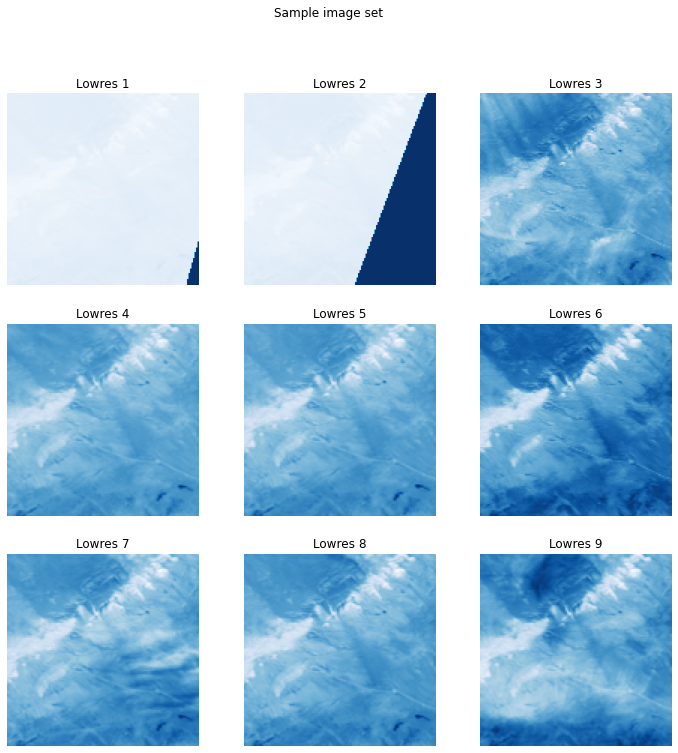

In [ ]:
plt.figure(figsize=(12, 12))

i = 0
while i < 9:
    image = train_lr_image[i]
    i += 1 
    ax = plt.subplot(3, 3, i)
    plt.imshow(train_lr_image[i], cmap='Blues')
    plt.title(f"Lowres {i}")
    plt.axis("off")
plt.suptitle("Sample image set")
plt.savefig('sample_image_set.png', dpi=350)

plt.show()

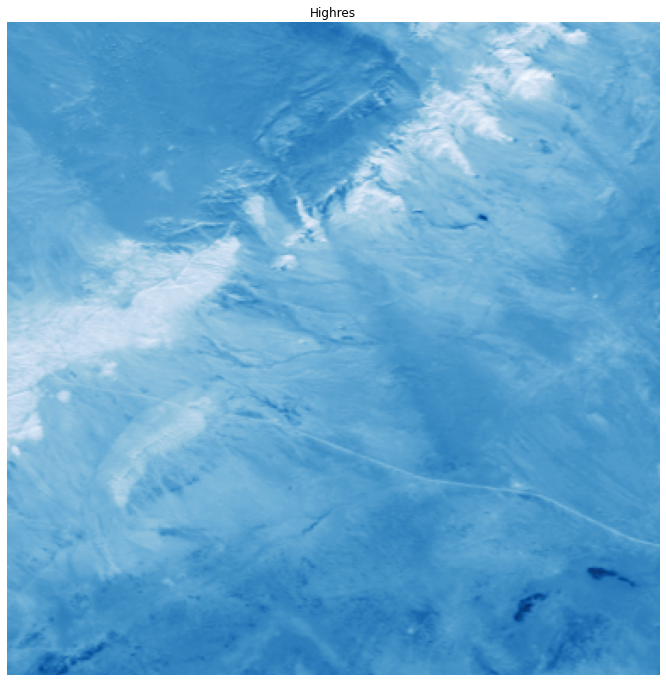

In [ ]:
plt.figure(figsize=(12, 12))
plt.imshow(train_hr_image.astype(float), cmap='Blues')
plt.axis("off")
plt.title("Highres")
plt.savefig('sample_hr_target.png', dpi=350, format='png')

## 2. WDSR-3D Network

The following network architecture is based on the one proposed in [Satellite Image Multi-Frame Super Resolution Using 3D Wide-Activation Neural Networks ](https://www.mdpi.com/2072-4292/12/22/3812).

In [ ]:
# Data constants
MEAN = 7433.6436
STD = 2353.0723
LR_SIZE = 34
HR_SIZE = 96

In [ ]:
# Helper functions
def normalize(X):
    return (X-MEAN)/STD

def denormalize(X):
    return X * STD + MEAN 

In [ ]:
# Define misc. layers
def conv3d_weightnorm(filters, kernel_size, padding='same', activation=None, **kwargs):
    return tfa.WeightNormalization(layers.Conv3D(filters, kernel_size, padding=padding, activation=activation, **kwargs), data_init=False)

def conv2d_weightnorm(filters, kernel_size, padding='same', activation=None, **kwargs):
    return tfa.WeightNormalization(layers.Conv2D(filters, kernel_size, padding=padding, activation=activation, **kwargs), data_init=False)

def reflective_padding(name):
    return layers.Lambda(lambda x: tf.pad(x,[[0,0],[1,1],[1,1],[0,0],[0,0]],mode='REFLECT',name=name))


In [ ]:
# Define main residual block (B)
def res_block(x_in, num_filters, expansion, kernel_size):
    linear = 0.8
    x = conv3d_weightnorm(num_filters * expansion, 1, padding='same', activation='relu')(x_in)
    x = conv3d_weightnorm(int(num_filters * linear), 1, padding='same')(x)
    x = conv3d_weightnorm(num_filters, kernel_size, padding='same')(x)
    return x_in + x

In [ ]:
def wdsr_3d(scale, num_filters, num_res_blocks, res_block_expansion, channels):
    main_inputs = Input(shape=(LR_SIZE, LR_SIZE,channels, 1))
    res_inputs = Input(shape=(LR_SIZE,LR_SIZE,1))

    x = layers.Lambda(normalize)(main_inputs)
    y = layers.Lambda(normalize)(res_inputs)
    
    # Main path (x->m)
    m = conv3d_weightnorm(num_filters, (3,3,3),padding='same',activation='relu')(x)
    for i in range(num_res_blocks):
        m = res_block(m, num_filters, res_block_expansion, kernel_size=3)
        
    for i in range(0,np.floor_divide(channels,3)):
        m = reflective_padding(name="ref_padding_{}".format(i))(m)
        m = conv3d_weightnorm(num_filters, (3,3,3), padding='valid',activation='relu',
                              name="Conv_Reducer_{}".format(i))(m)
    m = conv3d_weightnorm(scale ** 2, (3,3,3),
                      padding='valid')(m)
    
    m = layers.Reshape((LR_SIZE-2,LR_SIZE-2,9))(m)
    m = layers.Lambda(lambda x: tf.nn.depth_to_space(x, 3))(m)
    
    # Residual path (y->y)
    y = layers.Lambda(lambda x: tf.pad(x,[[0,0],[1,1],[1,1],[0,0]],mode='REFLECT',name='padding_2d'))(y)
    y = conv2d_weightnorm(scale ** 2, (3,3),padding='valid', activation='relu')(y)
    y = conv2d_weightnorm(scale ** 2, (3,3),padding='valid')(y)
    y = layers.Lambda(lambda x: tf.nn.depth_to_space(x, 3))(y)

    # Output layer combining residual and main paths (y + m)
    outputs = y + m
    outputs = layers.Lambda(denormalize)(outputs)

    return Model([main_inputs,res_inputs], outputs, name="wdsr3d")

## 3. Loss functions

The following are modified L1 loss and PSNR functions to take into account pixel shifts between the images and visibility.  

In [ ]:
# NOTE: not for use with Tensors
def psnr(img_A, img_B):
    mse = np.mean((img_A - img_B) ** 2)
    # No noise, return 100
    if mse == 0:
        return 100
    return 20 * math.log10(255.0 / math.sqrt(mse))

def log10(x):
    n = tf.math.log(x)
    d = tf.math.log(tf.constant(10, dtype=n.dtype))
    return n / d

def l1_loss_shift(y_true, y_pred, y_mask):
    y_shape = tf.shape(y_true)
    border = 3
    max_pixels_shifts = 2*border
    size_image = HR_SIZE
    size_croped_image = size_image - max_pixels_shifts
    clear_pixels = size_croped_image*size_croped_image
    cropped_predictions = y_pred[:, border:size_image -
                                 border, border:size_image-border]

    X = []
    for i in range(max_pixels_shifts+1):
        for j in range(max_pixels_shifts+1): 
            cropped_labels = y_true[:, i:i+(size_image-max_pixels_shifts),
                                    j:j+(size_image-max_pixels_shifts)]
            cropped_y_mask = y_mask[:, i:i+(size_image-max_pixels_shifts),
                                    j:j+(size_image-max_pixels_shifts)]

            cropped_y_mask = tf.cast(cropped_y_mask, tf.float32)

            cropped_predictions_masked = tf.cast(
                cropped_predictions, tf.float32)*cropped_y_mask
            cropped_labels_masked = cropped_labels*cropped_y_mask

            total_pixels_masked = tf.reduce_sum(cropped_y_mask, axis=[1, 2])

            # Brightness bias
            b = (1.0/total_pixels_masked)*tf.reduce_sum(
                tf.subtract(cropped_labels_masked, cropped_predictions_masked),
                axis=[1, 2])

            b = tf.reshape(b, [y_shape[0], 1, 1, 1])

            corrected_cropped_predictions = cropped_predictions_masked+b
            corrected_cropped_predictions = corrected_cropped_predictions*cropped_y_mask

            l1_loss = (1.0/total_pixels_masked)*tf.reduce_sum(
                tf.abs(
                    tf.subtract(cropped_labels_masked,
                                corrected_cropped_predictions)
                ), axis=[1, 2]
            )
            X.append(l1_loss)
    X = tf.stack(X)
    min_l1 = tf.reduce_min(X, axis=0)

    return min_l1

def psnr_shift(y_true, y_pred, y_mask):
    y_shape = tf.shape(y_true)
    border = 3
    max_pixels_shifts = 2*border
    size_image = HR_SIZE
    size_croped_image = size_image - max_pixels_shifts
    clear_pixels = size_croped_image*size_croped_image
    cropped_predictions = y_pred[:, border:size_image -
                                 border, border:size_image-border]

    X = []
    for i in range(max_pixels_shifts+1):
        for j in range(max_pixels_shifts+1):
            cropped_labels = y_true[:, i:i+(size_image-max_pixels_shifts),
                                    j:j+(size_image-max_pixels_shifts)]
            cropped_y_mask = y_mask[:, i:i+(size_image-max_pixels_shifts),
                                    j:j+(size_image-max_pixels_shifts)]

            cropped_y_mask = tf.cast(cropped_y_mask, tf.float32)

            cropped_predictions_masked = tf.cast(
                cropped_predictions, tf.float32)*cropped_y_mask
            cropped_labels_masked = tf.cast(
                cropped_labels, tf.float32)*cropped_y_mask

            total_pixels_masked = tf.reduce_sum(cropped_y_mask, axis=[1, 2])

            # Brightness bias
            b = (1.0/total_pixels_masked)*tf.reduce_sum(
                tf.subtract(cropped_labels_masked, cropped_predictions_masked),
                axis=[1, 2])

            b = tf.reshape(b, [y_shape[0], 1, 1, 1])

            corrected_cropped_predictions = cropped_predictions_masked+b
            corrected_cropped_predictions = corrected_cropped_predictions*cropped_y_mask

            corrected_mse = (1.0/total_pixels_masked)*tf.reduce_sum(
                tf.square(
                    tf.subtract(cropped_labels_masked,
                                corrected_cropped_predictions)
                ), axis=[1, 2])

            cPSNR = 10.0*log10((65535.0**2)/corrected_mse)
            X.append(cPSNR)

    X = tf.stack(X)
    max_cPSNR = tf.reduce_max(X, axis=0)  
    return tf.reduce_mean(max_cPSNR)

## 4. Trainer class

In [ ]:
class Trainer:
    def __init__(self,
                 model,
                 loss, metric,
                 optimizer,
                 checkpoint_dir, log_dir):

        self.now = None
        self.loss = loss
        self.metric = metric
        self.log_dir = log_dir
        self.train_loss = metrics.Mean(name='train/loss')
        self.train_psnr = metrics.Mean(name='train/psnr')

        self.test_loss = metrics.Mean(name='test/loss')
        self.test_psnr = metrics.Mean(name='test/psnr')
        self.checkpoint = tf.train.Checkpoint(
            step=tf.Variable(0),
            psnr=tf.Variable(1.0),
            optimizer=optimizer,
            model=model)
        self.checkpoint_manager = tf.train.CheckpointManager(
            checkpoint=self.checkpoint,
            directory=checkpoint_dir,
            max_to_keep=5)
        self.restore()

    def restore(self):
        if self.checkpoint_manager.latest_checkpoint:
            self.checkpoint.restore(self.checkpoint_manager.latest_checkpoint)
            print(
                f'Model restored from checkpoint at step {self.checkpoint.step.numpy()}.')

    @property
    def model(self):
        return self.checkpoint.model
    
    def fit(self, x=None, y=None, batch_size=32, buffer_size=512, epochs=50,
            evaluate_every=100, val_steps=100, validation_data=None, 
            shuffle=True, initial_epoch=0, save_best_only=True):

        ds_len = (*x, *y)[0].shape[0]
        # Create dataset from slices
        train_ds = tf.data.Dataset.from_tensor_slices(
            (*x, *y)).shuffle(
                buffer_size, reshuffle_each_iteration=True).repeat(
                    epochs).batch(batch_size).prefetch(tf.data.AUTOTUNE)

        val_ds = tf.data.Dataset.from_tensor_slices(
            (*validation_data[0], *validation_data[1])
            ).shuffle(buffer_size).batch(batch_size).prefetch(
                tf.data.experimental.AUTOTUNE).take(val_steps)


        writer = tf.summary.create_file_writer(self.log_dir)

        total_steps = tf.cast(ds_len/batch_size,tf.int64)
        global_step = tf.cast(self.checkpoint.step,tf.int64)
        step = tf.cast(self.checkpoint.step,tf.int64) % total_steps 
        epoch = initial_epoch
        with writer.as_default():

            for x_batch_train, x_mean_batch_train, y_batch_train, y_mask_batch_train in train_ds:
                if (total_steps - step) == 0:
                    epoch+=1
                    step = tf.cast(self.checkpoint.step,tf.int64) % total_steps 
                    logger.info('Start of epoch %d' % (epoch))
                    self.train_loss.reset_states()
                    self.train_psnr.reset_states()
                    self.test_loss.reset_states()
                    self.test_psnr.reset_states()

                step +=1
                global_step += 1
                self.train_step(x_batch_train, x_mean_batch_train,
                                y_batch_train, y_mask_batch_train)
                self.checkpoint.step.assign_add(1)

                template = f"step {step}/{int(total_steps)}, loss: {self.train_loss.result():.3f}, psnr: {self.train_psnr.result():.3f}"
                logger.info(template)

                tf.summary.scalar(
                    'Train PSNR', self.train_psnr.result(), step=global_step)

                tf.summary.scalar(
                    'Train loss', self.train_loss.result(), step=global_step)

                if step != 0 and (step % evaluate_every) == 0:
                    self.test_loss.reset_states()
                    self.test_psnr.reset_states()
                    for x_batch_val, x_mean_batch_val, y_batch_val, y_mask_batch_val in val_ds:
                        self.test_step(
                            x_batch_val, x_mean_batch_val, y_batch_val, y_mask_batch_val)
                    tf.summary.scalar(
                        'Test loss', self.test_loss.result(), step=global_step)
                    tf.summary.scalar(
                        'Test PSNR', self.test_psnr.result(), step=global_step)
                    template = f"Validation results... val_loss: {self.test_loss.result():.3f}, val_psnr: {self.test_psnr.result():.3f}"
                    logger.info(template)
                    writer.flush()

                    if save_best_only and (self.test_psnr.result() <= self.checkpoint.psnr):
                        # If no PSNR improvement, skip saving checkpoint
                        continue
                    self.checkpoint.psnr = self.test_psnr.result()
                    self.checkpoint_manager.save()

    @tf.function # Comment out for debugging
    def train_step(self, lr, mean_lr, hr, mask):
        with tf.GradientTape() as tape:
            sr = self.checkpoint.model([lr, mean_lr], training=True)
            loss = self.loss(hr, sr, mask)

        gradients = tape.gradient(
            loss, self.checkpoint.model.trainable_variables)
        self.checkpoint.optimizer.apply_gradients(
            zip(gradients, self.checkpoint.model.trainable_variables))
        metric = self.metric(hr, sr, mask)
        self.train_loss(loss)
        self.train_psnr(metric)

    @tf.function # Comment out for debugging
    def test_step(self, lr, mean_lr, hr, mask):
        sr = self.checkpoint.model([lr, mean_lr], training=False)
        t_loss = self.loss(hr, sr, mask)
        t_metric = self.metric(hr, sr, mask)

        self.test_loss(t_loss)
        self.test_psnr(t_metric)


## 5. Training WDSR-3D network 

### 5.1 Tensorboard

In [ ]:
# Uncomment and change log location for use
# %load_ext tensorboard
# %tensorboard --logdir /content/drive/MyDrive/cs6344_superresolution/logs/

<IPython.core.display.Javascript object>

### 5.2 Main train function

In [ ]:
def train(band, x_patches_file, x_merged_patches_file,
          y_patches_file, y_mask_patches_file, checkpoint_dir, log_dir, val_split):

    model = wdsr_3d(3, 32, 8, 6, 7)

    trainer_nir = Trainer(model,
                            loss=l1_loss_shift,
                            metric=psnr_shift,
                            optimizer=tf.keras.optimizers.Adam(
                                      learning_rate=5e-2),
                            checkpoint_dir=checkpoint_dir,
                            log_dir=log_dir)

    X_train_patches = np.load(
        x_patches_file, allow_pickle=True)
    X_train_merged_patches = np.load(
        x_merged_patches_file, allow_pickle=True)
    y_train_patches = np.load(
        y_patches_file, allow_pickle=True)
    y_train_mask_patches = np.load(
        y_mask_patches_file, allow_pickle=True)

    X_train, X_val, X_train_merged, X_val_merged, y_train, y_val, y_train_mask, y_val_mask = train_test_split(
        X_train_patches, X_train_merged_patches, y_train_patches, y_train_mask_patches, test_size=val_split, random_state=42)


    # Clear up main memory before training
    del X_train_patches, X_train_merged_patches, y_train_patches, y_train_mask_patches

    gc.collect()

    trainer_nir.fit([X_train, X_train_merged],
                    [y_train, y_train_mask],
                    batch_size=32,
                    validation_data=([X_val, X_val_merged], [y_val, y_val_mask]))

In [ ]:
train('NIR',
      'processed/dataset_NIR_X_patches.npy',
      'processed/dataset_NIR_X_merged_patches.npy',
      'processed/dataset_NIR_y_patches.npy',
      'processed/dataset_NIR_y_mask_patches.npy',
      model_dir,
      log_dir,
      0.1)

## 6. Evaluation

In [ ]:
def resolve_batch(model, lr_batch, lr_mean_batch):
    lr_batch = tf.cast(lr_batch, tf.float32)
    lr_mean_batch = tf.cast(lr_mean_batch, tf.float32)
    
    sr_batch = model([lr_batch,lr_mean_batch])
    sr_batch = tf.clip_by_value(sr_batch, 0, 2**16)
    sr_batch = tf.round(sr_batch)
    sr_batch = tf.cast(sr_batch, tf.float32)
    return sr_batch


def evaluate(model, X_test_patches, X_test_merged_patches):
    y_preds = []
    
    for i in tqdm(range(0, X_test_patches.shape[0], 16)):
        # Resolve
        res_patches = resolve_batch(model,np.expand_dims(X_test_patches[i:i+16],4),X_test_merged_patches[i:i+16])
        y_pred = reconstruct_from_patches(np.array(res_patches))
        y_preds.append(y_pred)
    return y_preds


def reconstruct_from_patches(images):
    rec_img = np.zeros((384, 384, 1))
    block_n = 0
    first_block = images[0, :, :, ]
    for i in range(1, 5):
        for j in range(1, 5):

            rec_img[(i-1)*96:i*96, (j-1)*96:j*96] = images[block_n, :, :, ]
            block_n += 1

    return rec_img.reshape((384, 384, 1))


In [ ]:
def predict(band, patches_file, merged_patches_file,checkpoint_dir, output):
    logging.info('Loading test patches.')
    X_test_patches = np.load(patches_file, allow_pickle=True)
    X_test_merged_patches = np.load(merged_patches_file, allow_pickle=True)

 
    model = wdsr_3d(3, 32, 8, 6, 7)

    checkpoint = tf.train.Checkpoint(step=tf.Variable(0),
                                    psnr=tf.Variable(1.0),
                                    model=model)
    logging.info(f"Loading model from checkpoint {checkpoint}.")
    checkpoint_manager = tf.train.CheckpointManager(checkpoint=checkpoint,
                                                    directory=checkpoint_dir,
                                                    max_to_keep=5)
    checkpoint.restore(checkpoint_manager.latest_checkpoint)

    logging.info('Evaluating...')
    y_preds = evaluate(model, X_test_patches, X_test_merged_patches)

    band = band.upper()
    if band == 'NIR':
        i = 1306
    elif band=='RED':
        i = 1160
    
    logging.info(f'Saving predicted images to {output}')
    for img in tqdm(y_preds):
        io.imsave(os.path.join(output,f'imgset_{i}.png'),img[:,:,0].astype(np.uint16))
        i+=1

In [ ]:
predict('NIR',
        '/content/processed/dataset_NIR_X_test_patches.npy',
        '/content/processed/dataset_NIR_X_test_merged_patches.npy',
        model_dir,
        os.path.join(proj_root, 'results')
        )

### 6.1 Display results

In [ ]:
_, test_ds = load_data('/content/pickled', 'NIR')

2022-05-13 03:40:52,178 - Loading pickle datasets...
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must spec

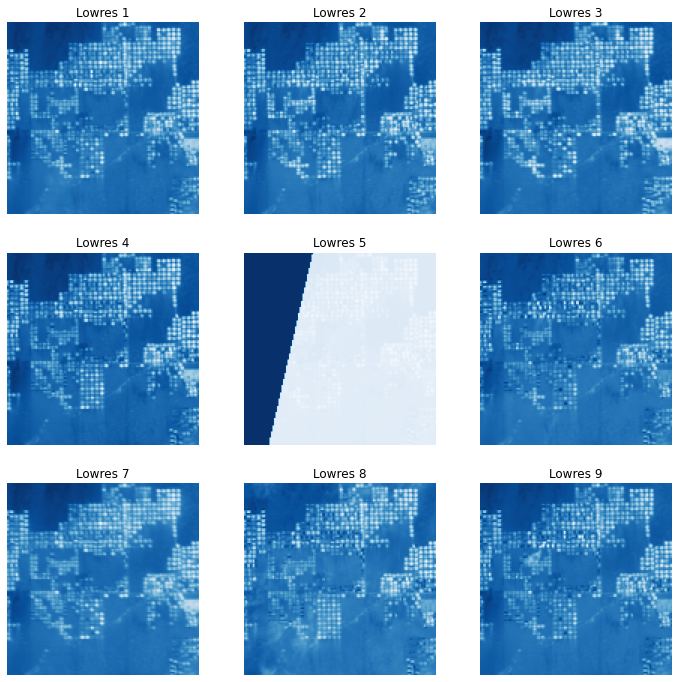

In [ ]:
predict_1307 = '/content/drive/MyDrive/cs6344_superresolution/results/imgset1307.png'
predicted = io.imread(predict_1307)

test_lr_1307 = test_ds[0][1]

plt.figure(figsize=(12, 12))
i = 0
while i < 9:
    image = test_lr_1307[i]
    i += 1 
    ax = plt.subplot(3, 3, i)
    plt.imshow(test_lr_1307[i], cmap='Blues')
    plt.title(f"Lowres {i}")
    plt.axis("off")
plt.savefig("low_res_inputs.png", dpi=350)
plt.show()

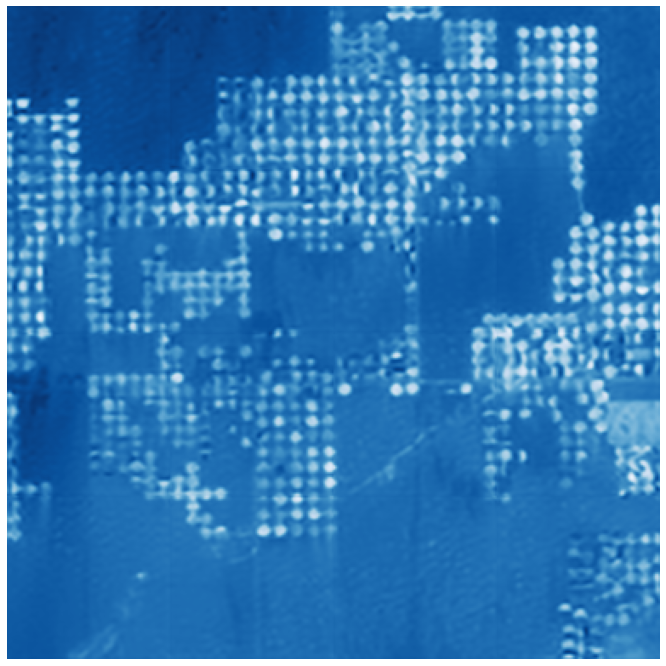

In [ ]:
plt.figure(figsize=(12, 12))

plt.imshow(predicted, cmap='Blues')
plt.axis("off")

plt.savefig("super_res_output.png", dpi=350)

## 7. SRGAN (work-in-progress)

The following remains a work in progress.

In [ ]:
def gray_to_color(X: tf.Tensor) -> tf.Tensor:
    return tf.repeat(tf.expand_dims(X, axis=3), 3,axis=3)

def normalize_zero(X: Any) -> Any:
    return X / 127.5 - 1

In [ ]:
def discriminator_block(x_in, num_filters, strides=1, batchnorm=True, momentum=0.8):
    x = layers.Conv2D(num_filters, kernel_size=3, strides=strides, padding='same')(x_in)
    if batchnorm:
        x = layers.BatchNormalization(momentum=momentum)(x)
    return layers.LeakyReLU(alpha=0.2)(x)


def discriminator(num_filters=8): # Try with different num_filters 
    x_in = Input(shape=(HR_SIZE, HR_SIZE, 3))
    x = layers.Lambda(normalize_zero)(x_in)
    
    x = discriminator_block(x, num_filters, batchnorm=False)
    x = discriminator_block(x, num_filters, strides=2)

    x = discriminator_block(x, num_filters * 2)
    x = discriminator_block(x, num_filters * 2, strides=2)

    x = discriminator_block(x, num_filters * 4)
    x = discriminator_block(x, num_filters * 4, strides=2)

    x = discriminator_block(x, num_filters * 8)
    x = discriminator_block(x, num_filters * 8, strides=2)

    x = layers.Flatten()(x)

    x = layers.Dense(1024)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    x = layers.Dense(1, activation='sigmoid')(x)

    return Model(x_in, x)


def vgg_22():
    return _vgg(5)

def _vgg(output_layer):
    vgg = vgg19.VGG19(input_shape=(None, None, 3), include_top=False)
    return Model(vgg.input, vgg.layers[output_layer].output)

### 7.1 SRGAN3D Trainer (work-in-progress)

In [ ]:
class SRGAN3DTrainer:
    def __init__(self,
                 generator,
                 discriminator,
                 lr=schedules.PiecewiseConstantDecay(boundaries=[100000])):


        self.vgg = vgg_22()
        self.generator = generator
        self.discriminator = discriminator
        self.generator_optimizer = Adam(learning_rate=lr)
        self.discriminator_optimizer = Adam(learning_rate=lr)

        self.binary_cross_entropy = metrics.BinaryCrossentropy(from_logits=False)
        self.mean_squared_error = metrics.MeanSquaredError()


    def fit(self, x, y, epochs=50,batch_size=32, initial_epoch=0):
        pls_metric = metrics.Mean()
        dls_metric = metrics.Mean()
        step = 0


        for idx, lr in enumerate(x[0]):
            step += 1
           
            pl, dl = self.train_step(lr, x[1][idx], y[0][idx])
            pls_metric(pl)
            dls_metric(dl)

            if step % 50 == 0:
                print(f'Step:{step}, perceptual loss: {pls_metric.result():.2f}, discriminator loss: {dls_metric.result():.2f}')
                pls_metric.reset_states()
                dls_metric.reset_states()


    # @tf.function # Toggle for debugging 
    def train_step(self, lr, mean_lr, hr):
        hr = gray2rgb(hr)
        hr = hr.reshape((96, 96, 3))
        hr = tf.convert_to_tensor(hr[np.newaxis, :,:,:])
        lr = tf.convert_to_tensor(lr[np.newaxis,:,:,:,:])
        mean_lr = tf.convert_to_tensor(mean_lr[np.newaxis,:,:,:])

        
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            sr = self.generator([lr, mean_lr], training=True)
            sr = gray2rgb(sr)
            sr = sr.reshape((96, 96, 3))
            sr = sr[np.newaxis, :,:,:]

            hr_output = self.discriminator(hr, training=True)
            sr_output = self.discriminator(sr, training=True)
            d_loss = self.discriminator_loss(hr_output, sr_output)
            g_loss = self.generator_loss(sr_output)

            c_loss = self.content_loss(hr, sr)
            p_loss = c_loss + 0.001 * g_loss

            """
                ISSUE: tape.gradient returns None for all
                TODO: Rewrite so generator and discriminator phase are seperated
                into seperate functions / seperate tape scopes. 
            """
            gradients_of_generator = gen_tape.gradient(p_loss, self.generator.trainable_variables)
            gradients_of_discriminator = disc_tape.gradient(d_loss, self.discriminator.trainable_variables)

            self.generator_optimizer.apply_gradients(zip(gradients_of_generator, self.generator.trainable_variables))
            self.discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, self.discriminator.trainable_variables))

            return p_loss, d_loss

    def content_loss(self, hr, sr):
        sr = vgg19.preprocess_input(sr)
        hr = vgg19.preprocess_input(hr)
        
        sr_features = self.vgg(sr) / 12.75
        hr_features = self.vgg(hr) / 12.75
        mse = self.mean_squared_error(sr_features, hr_features)
        return mse

    def generator_loss(self, sr_out):
        return self.binary_cross_entropy(tf.ones_like(sr_out), sr_out)

    def discriminator_loss(self, hr_out, sr_out):
        hr_loss = self.binary_cross_entropy(tf.ones_like(hr_out), hr_out)
        sr_loss = self.binary_cross_entropy(tf.zeros_like(sr_out), sr_out)
        return hr_loss + sr_loss

In [ ]:
# Load WDSR-3D network for use as generator
model = wdsr_3d(3, 32, 8, 6, 7)

checkpoint = tf.train.Checkpoint(step=tf.Variable(0),
                                    psnr=tf.Variable(1.0),
                                    model=model)

checkpoint_manager = tf.train.CheckpointManager(checkpoint=checkpoint,
                                                    directory=model_dir,
                                                    max_to_keep=5)
checkpoint.restore(checkpoint_manager.latest_checkpoint)

In [ ]:
gan_trainer = SRGAN3DTrainer(generator=model, discriminator=discriminator())

In [ ]:
X_train_patches = np.load('/content/processed/dataset_NIR_X_patches.npy', allow_pickle=True)
X_train_merged_patches = np.load(
        '/content/processed/dataset_NIR_X_merged_patches.npy', allow_pickle=True)
y_train_patches = np.load(
        '/content/processed/dataset_NIR_y_patches.npy', allow_pickle=True)
y_train_mask_patches = np.load(
        '/content/processed/dataset_NIR_y_mask_patches.npy', allow_pickle=True)

In [ ]:
gan_trainer.fit([X_train_patches, X_train_merged_patches],
                    [y_train_patches, y_train_mask_patches])

ValueError: ignored